# Laboratory 1 Network Science

En el presente laboratorio de Network Science, se busca analizar los siguientes datasets de edge list: `example_1.txt` y `example_2.txt`.  
- Se calcularán las medidas básicas, comentando lo que se puede sospechar acerca de la distribución de grados de la red solo en función de la media y los grados extremos.
- Se graficará la distribución de grado en escala log-log y escala lineal, comentando cómo encaja esto con el análisis de la pregunta anterior.
- Se dibujará la red utilizando dos algoritmos de diseño: Spring y Circular, y se analizará cómo se reflejan en la apariencia de la red los hallazgos de los puntos anteriores.

In [1]:
#Cargando librerías
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

import networkx as nx



In [2]:
# Cargar los datasets
G1 = nx.read_edgelist('example_1.txt')
G2 = nx.read_edgelist('example_2.txt')


## Medidas básicas y distribución de Grados:


In [3]:

# Función para calcular medidas básicas de un grafo
def calcular_medidas_basicas(G):
    grados = [G.degree(n) for n in G.nodes()]
    max_grado = max(grados)
    min_grado = min(grados)
    media_grado = np.mean(grados)
    return max_grado, min_grado, media_grado

# Cálculo para G1
max_grado_G1, min_grado_G1, media_grado_G1 = calcular_medidas_basicas(G1)
print('Medidas para G1:')
print(G1)
print('Grado máximo:', max_grado_G1)
print('Grado mínimo:', min_grado_G1)
print('Grado medio:', media_grado_G1)

# Cálculo para G2
max_grado_G2, min_grado_G2, media_grado_G2 = calcular_medidas_basicas(G2)
print('\nMedidas para G2:')
print(G2)
print('Grado máximo:', max_grado_G2)
print('Grado mínimo:', min_grado_G2)
print('Grado medio:', media_grado_G2)

Medidas para G1:
Graph with 1000 nodes and 2991 edges
Grado máximo: 98
Grado mínimo: 3
Grado medio: 5.982

Medidas para G2:
Graph with 197 nodes and 1651 edges
Grado máximo: 43
Grado mínimo: 1
Grado medio: 16.761421319796955


- ¿Qué se puede sospechar acerca de la distribución de grados de la red solo en función de la media y los grados extremos?
    - La diferencia significativa entre el grado máximo y el grado medio sugiere que la red G1 podría tener una estructura conectada por hubs, es decir, que algunos nodos tienen muchos más enlaces que el promedio, dicha estructura es típica de las redes de escala libre.
    - En el caso de G2, aunque el grado máximo es menor que en G1, el grado medio es significativamente más alto. Esto podría indicar que se trata de una red conectada más densamente, posiblemente con una estructura más homogénea en comparación con G1.

## Distribución de Grado en escala Log-Log y Lineal.
- Graficar la distribución de grado en escala log-log y en escala lineal. 
- ¿Cómo encaja esto con el análisis anterior de las medidas básicas?.

In [4]:
def graficar_distribucion_grado(G, title):
    
    grados = [G.degree(n) for n in G.nodes()]
    kmin = min(grados)
    kmax = max(grados)

    # Escala lineal
    bin_edges_lineal = np.linspace(kmin, kmax, num=20)
    density_lineal, _ = np.histogram(grados, bins=bin_edges_lineal, density=True)
    x_lineal = (bin_edges_lineal[1:] + bin_edges_lineal[:-1]) / 2

    # Escala log-log
    bin_edges_log = np.logspace(np.log10(kmin), np.log10(kmax), num=20)
    density_log, _ = np.histogram(grados, bins=bin_edges_log, density=True)
    x_log = 10**((np.log10(bin_edges_log[1:]) + np.log10(bin_edges_log[:-1])) / 2)

    # Gráficas
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(x_lineal, density_lineal, 'o')
    plt.xlabel('Grado (k)')
    plt.ylabel('P(k)')
    plt.title(title + ' - Escala Lineal')
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.loglog(x_log, density_log, 'o')
    plt.xlabel('Grado (k)')
    plt.ylabel('P(k)')
    plt.title(title + ' - Escala Log-Log')
    plt.grid(True)

    plt.show()



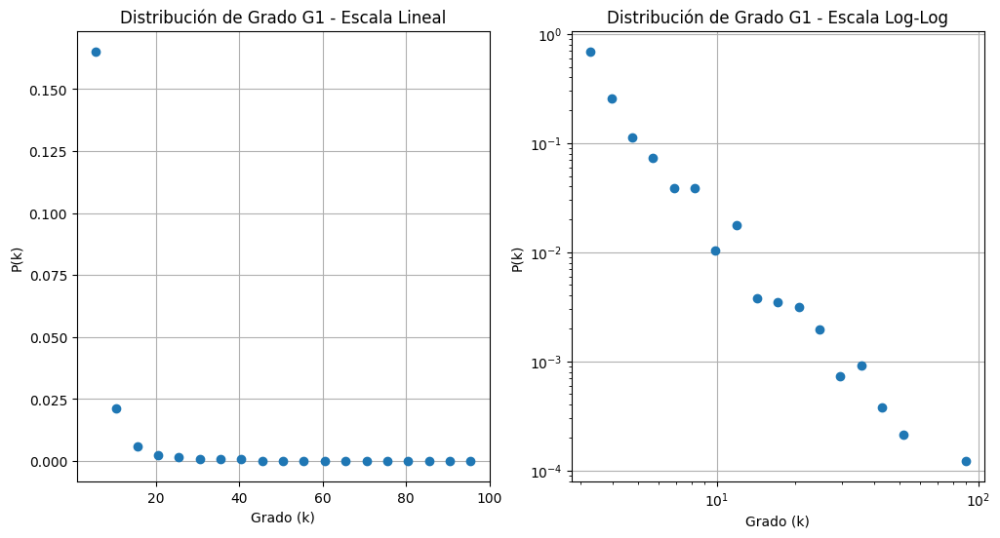

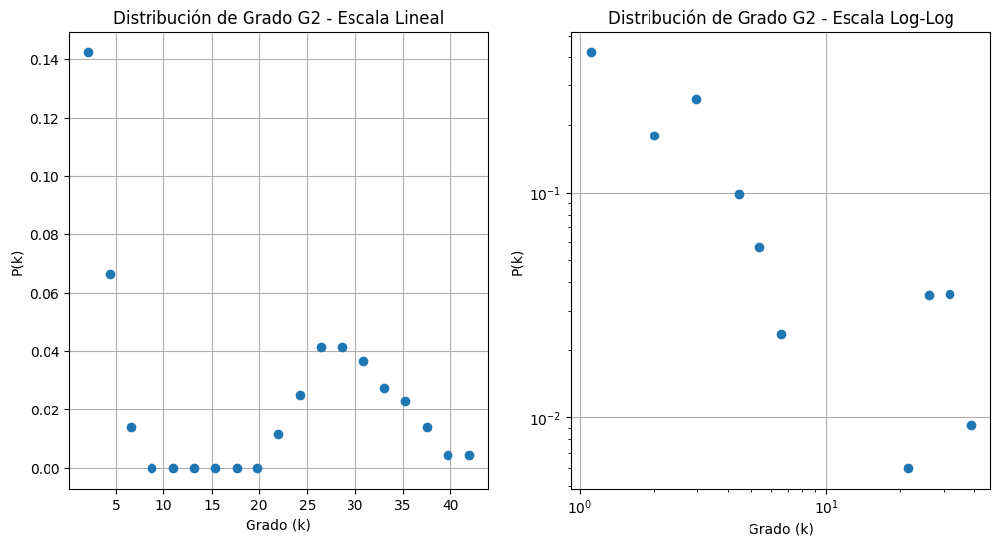

In [5]:

graficar_distribucion_grado(G1, 'Distribución de Grado G1')
graficar_distribucion_grado(G2, 'Distribución de Grado G2')


Al observar las distribuciones de grado en escala log-log y lineal, se puede destacar lo siguiente: 
- G1: 
    - La gráfica de distribución en escala lineal sigue una ley de potencia o distribución de cola pesada.
    - La distribución en escala log-log tiende a una línea recta para los grados altos.
    - Lo anterior, indica que hay pocos nodos con muchos enlaces y muchos nodos con pocos enlaces, característico de las redes de escala libre, respaldando la observación inicial de la presencia de hubs.

- G2: 
    - Los dos peaks en la distribución de grados se producen porque esta red consta de dos componentes, cada uno con características diferentes Uno es mucho más denso (promedio más alto) que el otro.
    
    - En la gráfica de distribución en escala lineal, se puede destacar que la distribución se asemeja a una ley de potencia hasta el grado k=20, pero luego parece seguir una distribución de Poisson hasta k=40. Esto sugiere que en el rango bajo de grados, hay muchos nodos con pocos enlaces, pero a medida que aumenta el grado, la distribución se vuelve más uniforme, como en una distribución de Poisson, es decir, hay una mezcla de características de la red, donde algunos nodos actúan como hubs, pero hay una tendencia general hacia una distribución más uniforme de los enlaces en el rango medio de grados.

    - La distribución en escala log-log NO muestra una línea recta con pendiente negativa, lo que puede indicar que G2 no sigue estrictamente una ley de potencia. Dicha característica indica que la red no se ajusta a una distribución de escala libre, lo cual es consistente con lo analizado en la pregunta N°1, en donde se indica un grado medio más alto y una estructura de red más uniforme.




## Visualización de la Red.
- ¿Cómo se reflejan en la apariencia de la red los hallazgos del análisis anterior?

G1 - Spring Layout


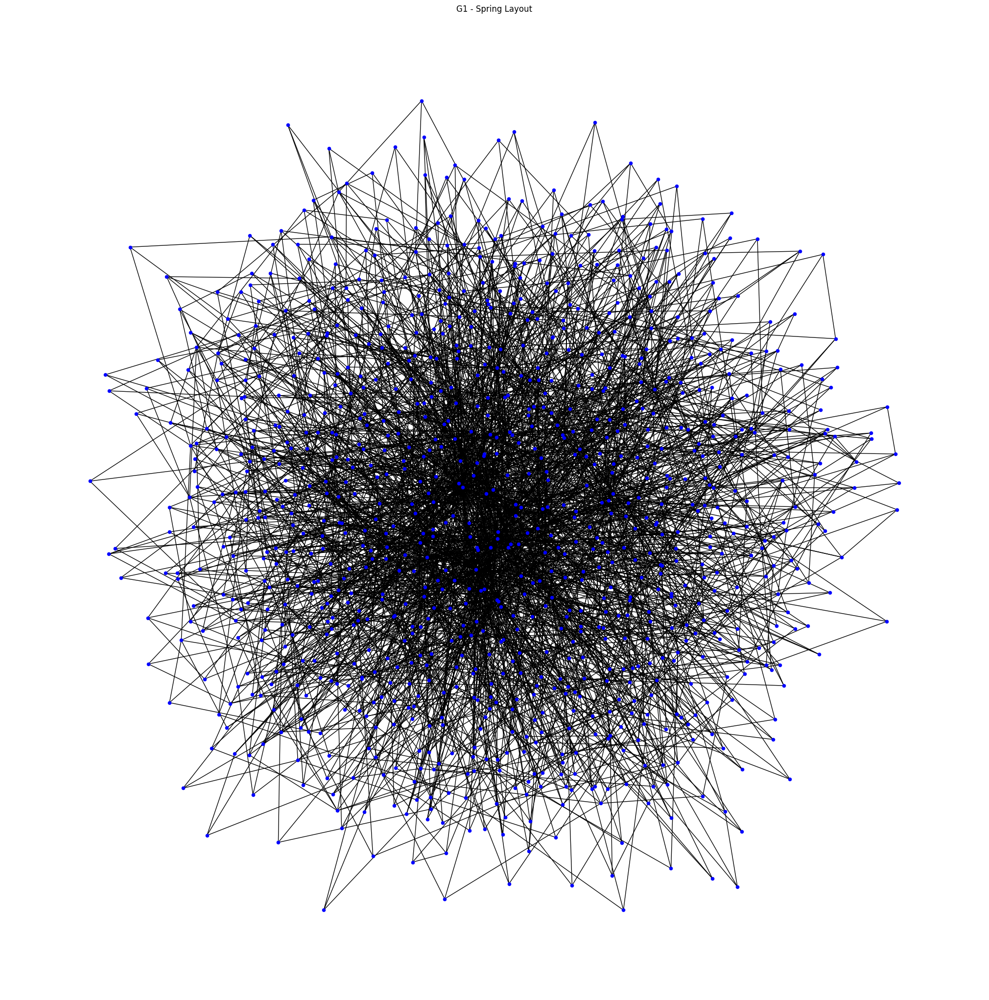

G1 - Circular Layout


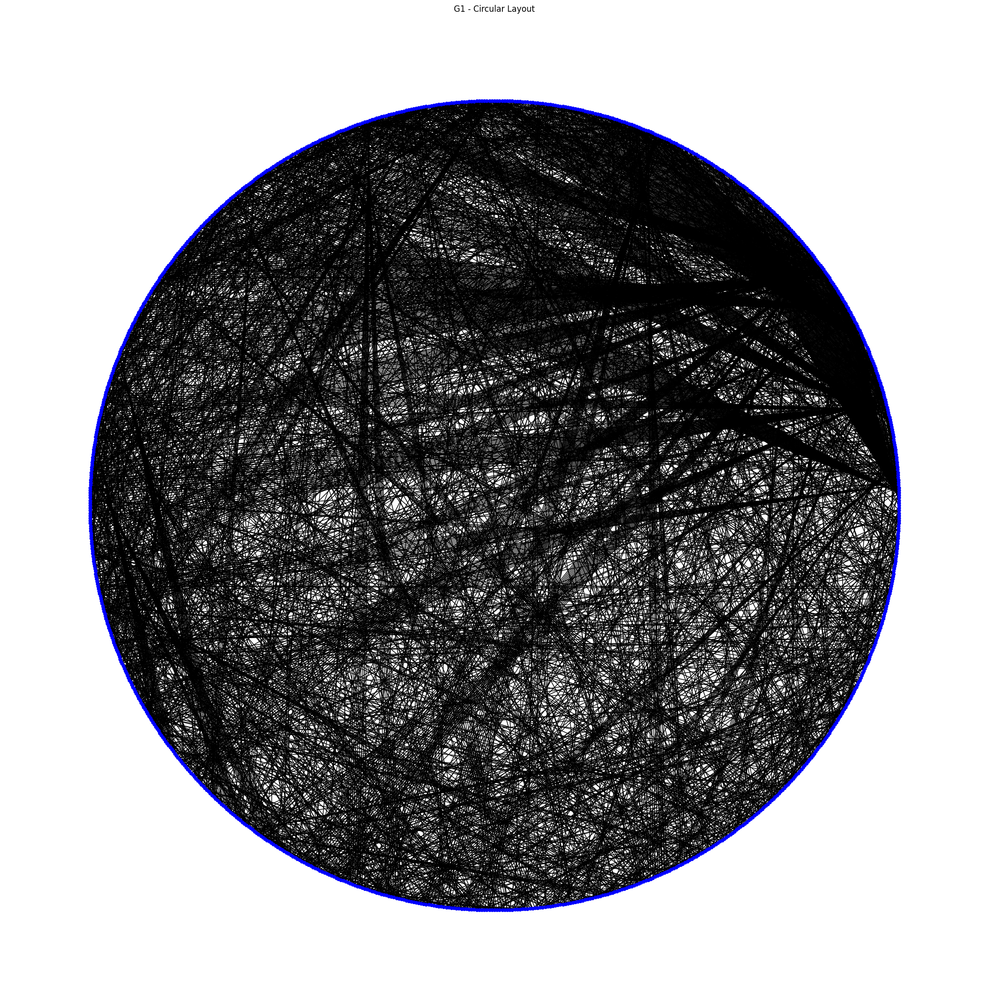

G2 - Spring Layout


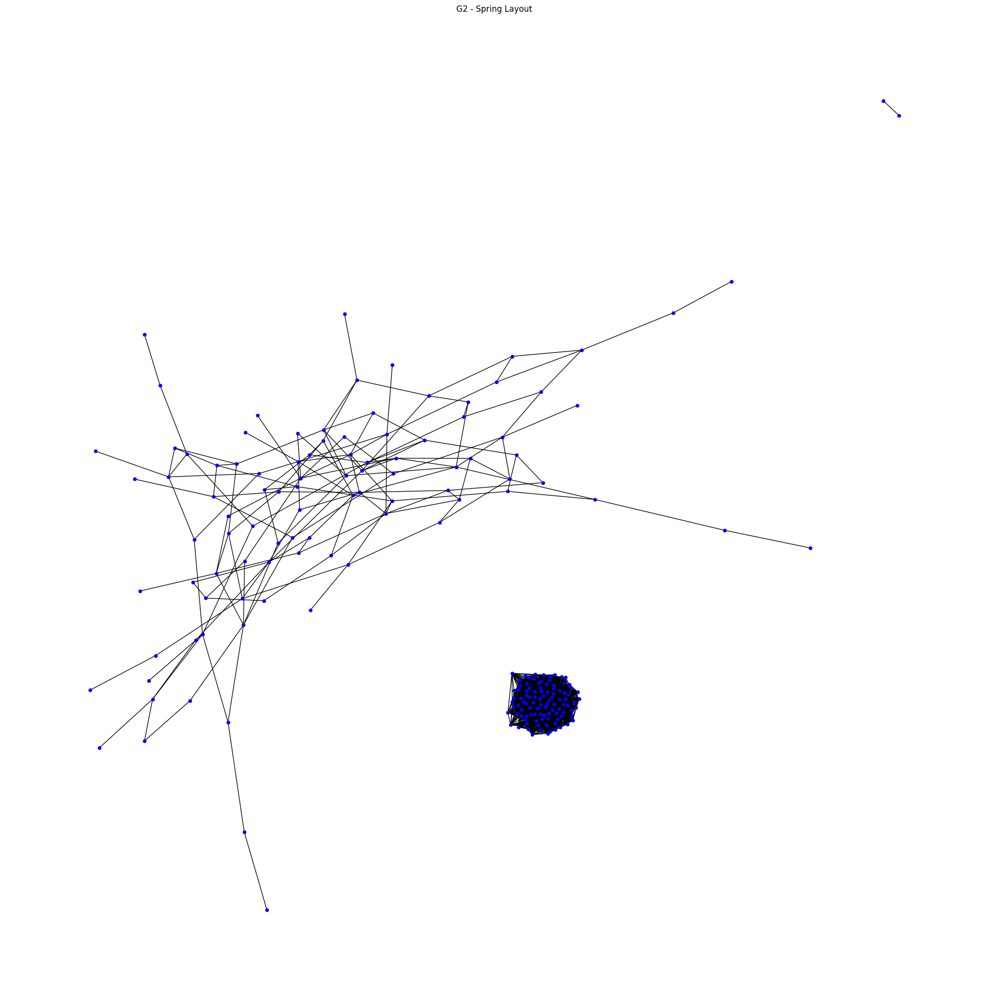

G2 - Circular Layout


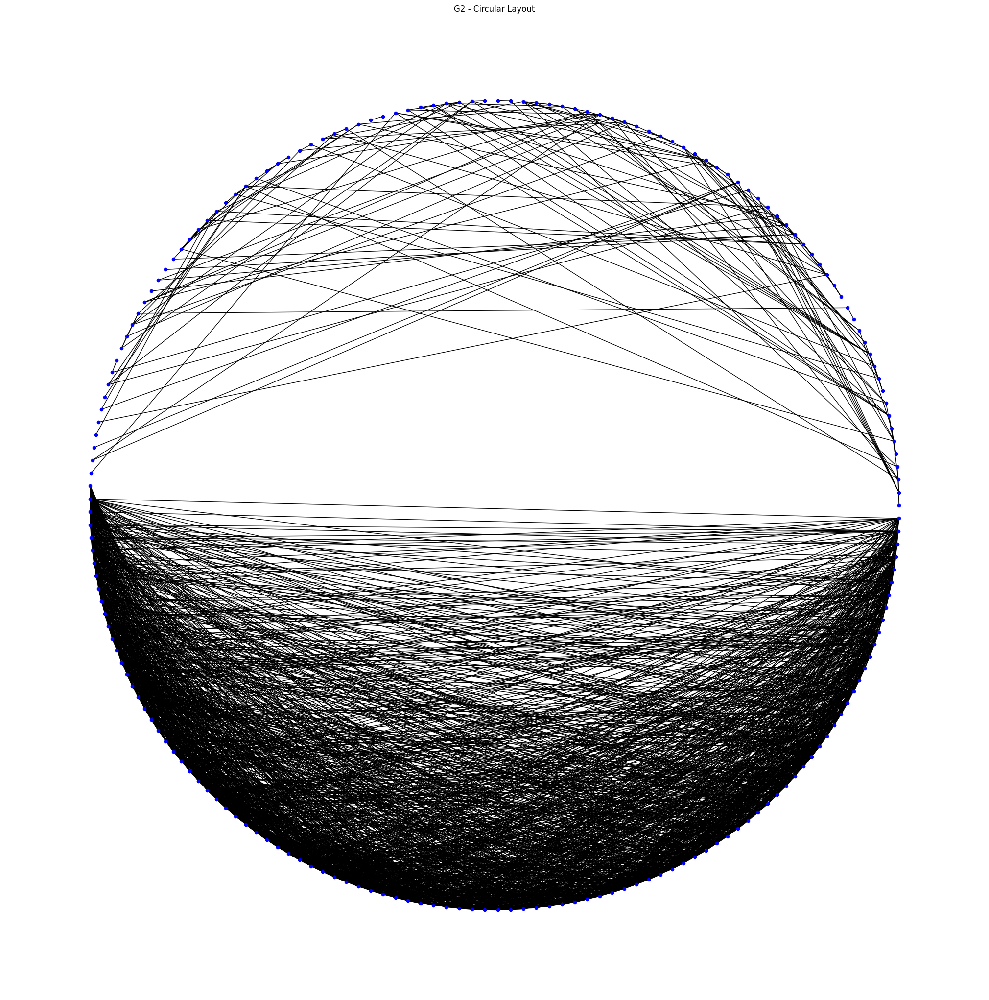

In [6]:
# Función para dibujar la red
def dibujar_red(G, title, layout):
    plt.figure(figsize=(20,20))
    if layout == 'spring':
        pos = nx.spring_layout(G)
    elif layout == 'circular':
        pos = nx.circular_layout(G)
    nx.draw(G, pos, node_size=20, node_color='blue', with_labels=False)
    plt.title(title)
    plt.show()

# G1 con layout spring
print('G1 - Spring Layout')
dibujar_red(G1, 'G1 - Spring Layout', 'spring')

# G1 con layout circular
print('G1 - Circular Layout')
dibujar_red(G1, 'G1 - Circular Layout', 'circular')

# G2 con layout spring
print('G2 - Spring Layout')
dibujar_red(G2, 'G2 - Spring Layout', 'spring')

# G2 con layout circular
print('G2 - Circular Layout')
dibujar_red(G2, 'G2 - Circular Layout', 'circular')

- Grafo G1:
    - El diseño spring resalta la distribución de grados y la estructura de la red con presencia de hubs y una gran cantidad de nodos con menos conexiones.
    - Se puede observar la agrupación de nodos hubs en el centro y la distribución de nodos menos conectados alrededor de ellos, creando una estructura visual que refleja la distribución de grados observada.
    - El diseño circular, al distribuir los nodos de manera uniforme, no resalta los hubs de manera tan evidente como el diseño spring. Esto puede hacer que sea más dificil identificar visualmente la estructura de la red.

- Grafo G2:
    - El diseño spring muestra una mezcla de características, al presentar una distribución más uniforme de los nodos, pero con un grupo o cluster denso que podría representar los nodos con mayor grado.
    - El diseño circular revela una separación en dos grupos, lo que podría reflejar la heterogeneidad en la distribución de grados. La parte superior muestra una distribución más uniforme, mientras que la parte inferior muestra una densidad mayor, posiblemente indicando la presencia de nodos con grados más altos.